In [1]:
# import libraries
import altair as alt
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import numpy as np
import seaborn as sns
# set Numpy to display floats in regular notation
np.set_printoptions(suppress=True)


In [2]:
campaign = pd.read_csv('https://raw.githubusercontent.com/byui-cse/cse450-course/master/data/bank.csv')

In [3]:
campaign.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [4]:
# select all rows of just the economic columns
economic_features = campaign.loc[:,"emp.var.rate":"y"]

In [5]:
economic_features.head()

,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,1.1,93.994,-36.4,4.857,5191.0,no
1,1.1,93.994,-36.4,4.857,5191.0,no
2,1.1,93.994,-36.4,4.857,5191.0,no
3,1.1,93.994,-36.4,4.857,5191.0,no
4,1.1,93.994,-36.4,4.857,5191.0,no


In [6]:
print(economic_features.info())
print(economic_features.value_counts())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 6 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   emp.var.rate    41188 non-null  float64
 1   cons.price.idx  41188 non-null  float64
 2   cons.conf.idx   41188 non-null  float64
 3   euribor3m       41188 non-null  float64
 4   nr.employed     41188 non-null  float64
 5   y               41188 non-null  object 
dtypes: float64(5), object(1)
memory usage: 1.9+ MB
None
emp.var.rate  cons.price.idx  cons.conf.idx  euribor3m  nr.employed  y  
 1.1          93.994          -36.4          4.857      5191.0       no     2796
 1.4          93.918          -42.7          4.962      5228.1       no     1904
                                             4.963      5228.1       no     1238
 1.1          93.994          -36.4          4.856      5191.0       no     1178
 1.4          93.444          -36.1          4.963      5228.1       no     11

#### Lets use K-Means clustering to split the economic data into two groups and hopefully each group will indicate if we are in a good or bad economy.

In [17]:
# extract only the ecnomic features without the variable
features = ["emp.var.rate", "cons.price.idx", "cons.conf.idx", "euribor3m", "nr.employed"]
e_features_df = economic_features.loc[:, features]
e_features = economic_features.loc[:, features].values

econ_sample = e_features_df.sample(n=5000)

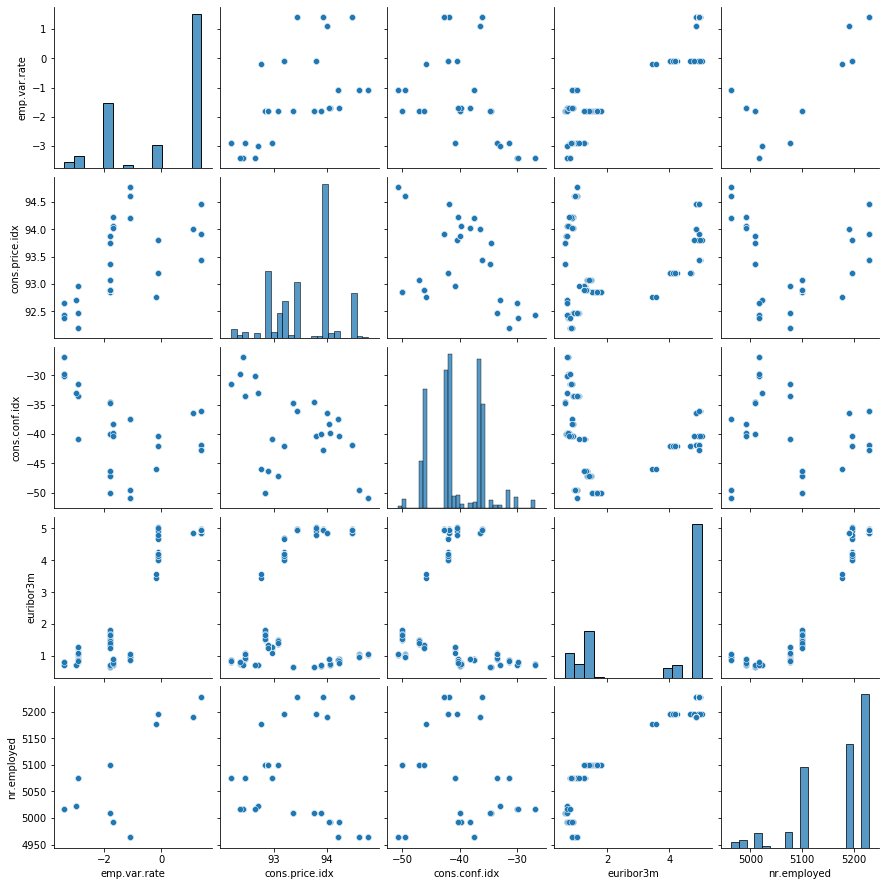

In [18]:
sns.pairplot(data=econ_sample)